# 🏎️ **Anomaly Detection in the FSAE Athena EV using Dynamic Bayesian Networks**

**Import useful libraries**

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

import logging
logging.getLogger().setLevel(logging.CRITICAL)
logging.getLogger("matplotlib").setLevel(logging.WARNING)

import warnings
warnings.filterwarnings('ignore')

from utilities import DBNModel, DataVisualizer

## 🛠️ Build the Dynamic Bayesian Netowrk

The proposed Dynamic Bayesian Network (DBN) is a two time-slice Bayesian network
(2-TBN) specifically designed to model the normal operational behavior of the
Athena race car. The structure was primarily constructed using domain knowledge 
provided by the powertrain experts of UniBo Motorsport. The final network 
consists of 20 nodes and 40 directed edges, where each node represents a 
discretized random variable associated with a key physical components
of Athena.
 
The DBN topology was designed to reflect plausible physical causality, mainly 
inspired by the flow of heat and electric current within the system. Special 
attention was paid to preserve the left-right symmetry of the car in both 
structure and variable treatment.

Below, we detail the meaning of the causal links selected for the 
intra-slice structure of the network. Inter-slice edges, which model temporal
dependencies (i.e., the relationship of a variable with its future state), 
are not explicitly described.

**Intra-Slice Causal Relations:**

* `BatteryCurrent_A` $\Rightarrow$ `BatteryPackTemp_C`
    - The erogated current directly impacts the temperature of the battery pack. 
    High current demands, as encountered during high-performance racing, 
    typically lead to elevated battery temperatures due to internal resistance 
    and thermal effects.

* `BatteryCurrent_A` $\Rightarrow$ `InverterSpeed_RearLeft_RPM` and `BatteryCurrent_A` $\Rightarrow$ `InverterSpeed_RearRight_RPM`
    - The battery current availability influences the inverter output speeds,
    as higher current delivery is required to achieve greater motor speeds.

* `BatteryCurrent_A` $\Rightarrow$ `Inverter_Iq_Ref_RearLeft_A` and `BatteryCurrent_A` $\Rightarrow$ `Inverter_Iq_Ref_RearRight_A`
    - The inverter’s reference current (Iq) for the rear motors depends on the 
    available battery current. Since the inverter modulates the current to meet 
    torque demands, this relationship captures the energy management process 
    between the battery and the drivetrain.


* `BatteryPackTemp_C` $\Rightarrow$ `MotorTemp_RearLeft_C` and `BatteryPackTemp_C` $\Rightarrow$ `MotorTemp_RearRight_C`
* `BatteryPackTemp_C` $\Rightarrow$ `InverterTemp_RearLeft_C` and `BatteryPackTemp_C` $\Rightarrow$ `InverterTemp_RearRight_C`
    - The battery pack temperature influences both the motor and inverter 
    temperatures, as the heat generated in the battery can propagate through 
    the thermal management system, impacting connected components.


* `InverterSpeed_RearLeft_RPM` $\Rightarrow$ `MotorTemp_RearLeft_C` and `InverterSpeed_RearRight_RPM` $\Rightarrow$ `MotorTemp_RearRight_C`
    - Increased inverter speeds are associated with higher mechanical and 
    thermal loads on the motors. As the motor speed rises, frictional losses, 
    and mechanical stresses intensify, leading to greater heat generation.


* `Inverter_Iq_Ref_RearLeft_A` $\Rightarrow$ `MotorTemp_RearLeft_C` and `Inverter_Iq_Ref_RearRight_A` $\Rightarrow$ `MotorTemp_RearRight_C`
    - The reference current (Iq) correlates directly with the torque production 
    of the motors. Higher torque demands result in increased electrical and 
    thermal loads, leading to motor temperature rises.


* `InverterTemp_RearLeft_C` $\Rightarrow$ `MotorTemp_RearLeft_C` and `InverterTemp_RearRight_C` $\Rightarrow$ `MotorTemp_RearRight_C`
    - The inverter temperature affects the adjacent motor temperature. This 
    causal link was primarily motivated by insights obtained through discrete 
    factor analysis.


Variables like `BatteryVoltage_V`, `Inverter_Id_Ref_RearLeft_A`, and 
`Inverter_Id_Ref_RearRight_A` were excluded to keep the network simpler and 
because they showed weak causal connections with key components based on data 
analysis and domain knowledge.


### 🔷 Define inter-slice edges

In [2]:
inter_slice_edges = [
    # 1. BatteryCurrent_A
    (('BatteryCurrent_A', 0), ('BatteryCurrent_A', 1)),

    # 2. BatteryPackTemp_C
    (('BatteryPackTemp_C', 0), ('BatteryPackTemp_C', 1)),
    
    # 3. BatteryVoltage_V
    # (('BatteryVoltage_V', 0), ('BatteryVoltage_V', 1)),
    
    # 4. InverterSpeed_RearLeft_RPM
    (('InverterSpeed_RearLeft_RPM', 0), ('InverterSpeed_RearLeft_RPM', 1)),
    
    # 5. InverterSpeed_RearRight_RPM
    (('InverterSpeed_RearRight_RPM', 0), ('InverterSpeed_RearRight_RPM', 1)),
    
    # 6. InverterTemp_RearLeft_C
    (('InverterTemp_RearLeft_C', 0), ('InverterTemp_RearLeft_C', 1)),
    
    # 7. InverterTemp_RearRight_C
    (('InverterTemp_RearRight_C', 0), ('InverterTemp_RearRight_C', 1)),
    
    # 8. Inverter_Iq_Ref_RearLeft_A
    (('Inverter_Iq_Ref_RearLeft_A', 0), ('Inverter_Iq_Ref_RearLeft_A', 1)),
    
    # 9. Inverter_Iq_Ref_RearRight_A
    (('Inverter_Iq_Ref_RearRight_A', 0), ('Inverter_Iq_Ref_RearRight_A', 1)),
    
    # 10. Inverter_Id_Ref_RearLeft_A
    # (('Inverter_Id_Ref_RearLeft_A', 0), ('Inverter_Id_Ref_RearLeft_A', 1)),
    
    # 11. Inverter_Id_Ref_RearRight_A
    # (('Inverter_Id_Ref_RearRight_A', 0), ('Inverter_Id_Ref_RearRight_A', 1)),
    
    # 12. MotorTemp_RearLeft_C
    (('MotorTemp_RearLeft_C', 0), ('MotorTemp_RearLeft_C', 1)),
    
    # 13. MotorTemp_RearRight_C
    (('MotorTemp_RearRight_C', 0), ('MotorTemp_RearRight_C', 1))
]

### 🔷 Define intra-slice edges

In [3]:
intra_slice_edges = [
    # 1. BatteryCurrent_A
    (("BatteryCurrent_A", 0), ("BatteryPackTemp_C", 0)),
    (("BatteryCurrent_A", 0), ("InverterSpeed_RearLeft_RPM", 0)),
    (("BatteryCurrent_A", 0), ("InverterSpeed_RearRight_RPM", 0)),
    (("BatteryCurrent_A", 0), ("Inverter_Iq_Ref_RearLeft_A", 0)),
    (("BatteryCurrent_A", 0), ("Inverter_Iq_Ref_RearRight_A", 0)),

    # 2. BatteryPackTemp_C
    (("BatteryPackTemp_C", 0), ("MotorTemp_RearLeft_C", 0)),
    (("BatteryPackTemp_C", 0), ("MotorTemp_RearRight_C", 0)),
    (("BatteryPackTemp_C", 0), ("InverterTemp_RearLeft_C", 0)),
    (("BatteryPackTemp_C", 0), ("InverterTemp_RearRight_C", 0)),
    
    # 3. InverterSpeed_RearLeft_RPM
    (("InverterSpeed_RearLeft_RPM", 0), ("MotorTemp_RearLeft_C", 0)),
    
    # 4. InverterSpeed_RearRight_RPM
    (("InverterSpeed_RearRight_RPM", 0), ("MotorTemp_RearRight_C", 0)),
    
    # 5. Inverter_Iq_Ref_RearLeft_A
    (("Inverter_Iq_Ref_RearLeft_A", 0), ("InverterSpeed_RearLeft_RPM", 0)),
    
    # 6. Inverter_Iq_Ref_RearRight_A
    (("Inverter_Iq_Ref_RearRight_A", 0), ("InverterSpeed_RearRight_RPM", 0)),
    
    # 7. InverterTemp_RearLeft_C
    (("InverterTemp_RearLeft_C", 0), ("MotorTemp_RearLeft_C", 0)),
    
    # 8. InverterTemp_RearRight_C
    (("InverterTemp_RearRight_C", 0), ("MotorTemp_RearRight_C", 0)),
]

### 🔷 Check the DBN model

In [4]:
# Initialize the DBN model
dbn_model = DBNModel(intra_slice_edges, inter_slice_edges)

Initialized and built the Dynamic Bayesian Network with 20 nodes and 40 edges.


### 🔷 Visualize the DBN strcutre

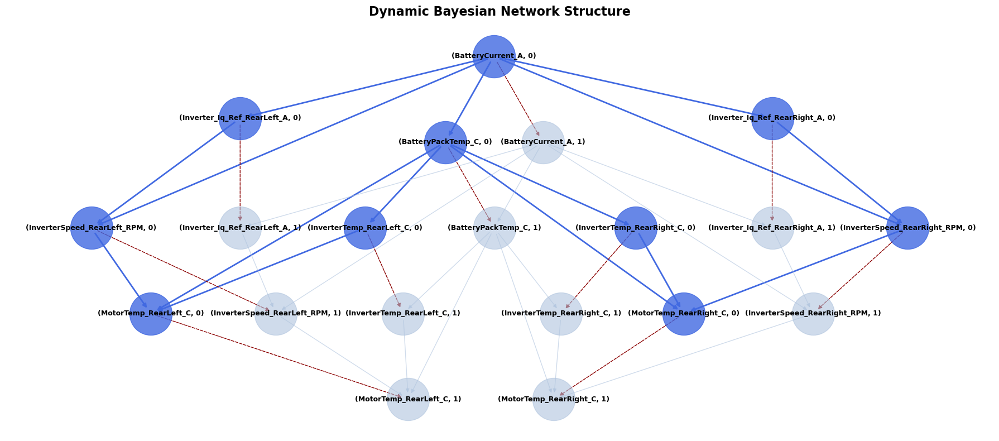

In [5]:
# Visualize the DBN structure
dbn_model.plot_structure()

## 🏈 Train the Dynamic Bayesian Network

The DBN model is trained to learn the normal behavior of the system, so the 
dataset with only normal observations is used. Training was performed on 
the non-aggregated dataset, applying threshold-based binning to discretize 
continuous variables while ensuring a meaningful categorical representation while 
preserving important system symmetries, particularly between the left and right 
sides of the car.

These processing methods were selected because they provided better results 
compared to using aggregated data and K-Means discretization.

### 🔷 Load normal dataset

In [6]:
# Load normal data
normal_dbn_data = pd.read_csv(r'.\data\dbn-datasets-imola\normal-dbn-imola.csv', header=[0, 1]).astype(np.int8)

# Reformat column names for pgmpy DBN (variable, time slice)
normal_dbn_data.columns = pd.MultiIndex.from_tuples(
    [(var, int(ts)) for var, ts in normal_dbn_data.columns]
)

# Display basic information about the dataset
display(normal_dbn_data.info(verbose=True))
display(normal_dbn_data.head())
display(normal_dbn_data.describe())

# Split into training and testing sets
train_normal_dbn_data, test_normal_dbn_data = train_test_split(
    normal_dbn_data, test_size=0.1, random_state=42
)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1216018 entries, 0 to 1216017
Data columns (total 26 columns):
 #   Column                            Non-Null Count    Dtype
---  ------                            --------------    -----
 0   (BatteryVoltage_V, 0)             1216018 non-null  int8 
 1   (BatteryCurrent_A, 0)             1216018 non-null  int8 
 2   (BatteryPackTemp_C, 0)            1216018 non-null  int8 
 3   (InverterSpeed_RearLeft_RPM, 0)   1216018 non-null  int8 
 4   (Inverter_Iq_Ref_RearLeft_A, 0)   1216018 non-null  int8 
 5   (Inverter_Id_Ref_RearLeft_A, 0)   1216018 non-null  int8 
 6   (MotorTemp_RearLeft_C, 0)         1216018 non-null  int8 
 7   (InverterTemp_RearLeft_C, 0)      1216018 non-null  int8 
 8   (InverterSpeed_RearRight_RPM, 0)  1216018 non-null  int8 
 9   (Inverter_Iq_Ref_RearRight_A, 0)  1216018 non-null  int8 
 10  (Inverter_Id_Ref_RearRight_A, 0)  1216018 non-null  int8 
 11  (MotorTemp_RearRight_C, 0)        1216018 non-null  int8 
 12  

None

,BatteryVoltage_V,BatteryCurrent_A,BatteryPackTemp_C,InverterSpeed_RearLeft_RPM,Inverter_Iq_Ref_RearLeft_A,Inverter_Id_Ref_RearLeft_A,MotorTemp_RearLeft_C,InverterTemp_RearLeft_C,InverterSpeed_RearRight_RPM,Inverter_Iq_Ref_RearRight_A,...,InverterSpeed_RearLeft_RPM,Inverter_Iq_Ref_RearLeft_A,Inverter_Id_Ref_RearLeft_A,MotorTemp_RearLeft_C,InverterTemp_RearLeft_C,InverterSpeed_RearRight_RPM,Inverter_Iq_Ref_RearRight_A,Inverter_Id_Ref_RearRight_A,MotorTemp_RearRight_C,InverterTemp_RearRight_C
,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
0,2,0,0,0,1,2,0,0,0,1,...,0,1,2,0,0,0,1,2,0,0
1,2,0,0,0,1,2,0,0,0,1,...,0,1,2,0,0,0,1,2,0,0
2,2,0,0,0,1,2,0,0,0,1,...,0,1,2,0,0,0,1,2,0,0
3,2,0,0,0,1,2,0,0,0,1,...,0,1,2,0,0,0,1,2,0,0
4,2,0,0,0,1,2,0,0,0,1,...,0,1,2,0,0,0,1,2,0,0


,BatteryVoltage_V,BatteryCurrent_A,BatteryPackTemp_C,InverterSpeed_RearLeft_RPM,Inverter_Iq_Ref_RearLeft_A,Inverter_Id_Ref_RearLeft_A,MotorTemp_RearLeft_C,InverterTemp_RearLeft_C,InverterSpeed_RearRight_RPM,Inverter_Iq_Ref_RearRight_A,...,InverterSpeed_RearLeft_RPM,Inverter_Iq_Ref_RearLeft_A,Inverter_Id_Ref_RearLeft_A,MotorTemp_RearLeft_C,InverterTemp_RearLeft_C,InverterSpeed_RearRight_RPM,Inverter_Iq_Ref_RearRight_A,Inverter_Id_Ref_RearRight_A,MotorTemp_RearRight_C,InverterTemp_RearRight_C
,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
count,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,...,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06,1.216018e+06
mean,1.182606e+00,6.484592e-01,1.059993e+00,9.796582e-01,1.300675e+00,1.591245e+00,9.047374e-01,1.178480e+00,8.281983e-01,7.041853e-01,...,9.796598e-01,1.300675e+00,1.591245e+00,9.047399e-01,1.178483e+00,8.281983e-01,7.041853e-01,1.595500e+00,9.758170e-01,1.214734e+00
std,7.046962e-01,6.974902e-01,7.381109e-01,7.830022e-01,4.764103e-01,6.903638e-01,4.279931e-01,5.758353e-01,8.525175e-01,4.807741e-01,...,7.830012e-01,4.764103e-01,6.903638e-01,4.279908e-01,5.758329e-01,8.525175e-01,4.807741e-01,6.809993e-01,4.654318e-01,5.732207e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
50%,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000e+00,1.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00
75%,2.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,1.000000e+00,...,2.000000e+00,2.000000e+00,2.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,1.000000e+00,2.000000e+00,1.000000e+00,2.000000e+00
max,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,...,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00


### 🔷 Fit normal data into the model

In [8]:
%%time

# Train the DBN model using Maximum Likelihood Estimation (MLE)
dbn_model.train(train_normal_dbn_data)

Training the DBN model using Maximum Likelihood Estimation...
DBN model training completed.
Wall time: 3 s


### 🔷 Visualize the learned CPDs as discrete factors

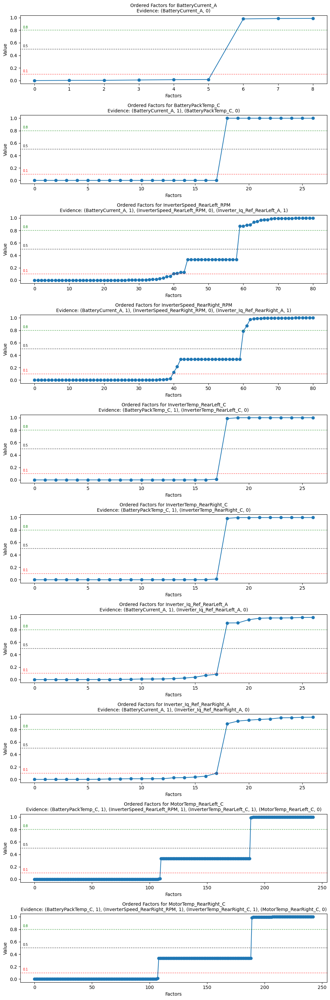

In [9]:
# Visualize learned Conditional Probability Tables (CPTs) as discrete factors
dbn_model.plot_factors()

## 🔬 Analysis of the Dynamic Bayesian Network structure

### 🔷 Local Independencies


🔍 Visualizing local independencies for node: (BatteryCurrent_A, 0)
⚠️ No independencies found.
❌ Could not visualize local independencies for node (BatteryCurrent_A, 0).
Exception: list index out of range


🔍 Visualizing local independencies for node: (BatteryCurrent_A, 1)
(1, BatteryCurrent_A ⟂ (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (InverterTemp_RearLeft_C, 0), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (InverterSpeed_RearRight_RPM, 0), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0) | (BatteryCurrent_A, 0))


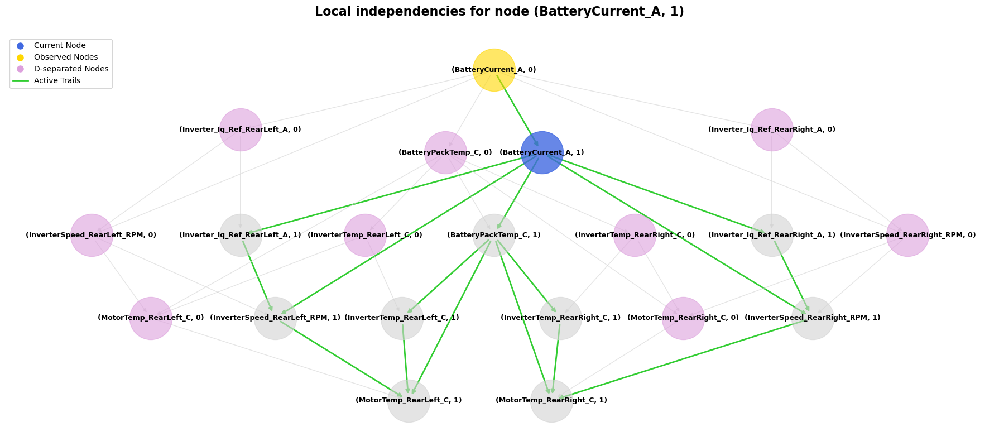


🔍 Visualizing local independencies for node: (BatteryPackTemp_C, 0)
(0, BatteryPackTemp_C ⟂ (BatteryCurrent_A, 1), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (InverterSpeed_RearRight_RPM, 0), (InverterSpeed_RearLeft_RPM, 1), (InverterSpeed_RearLeft_RPM, 0) | (BatteryCurrent_A, 0))


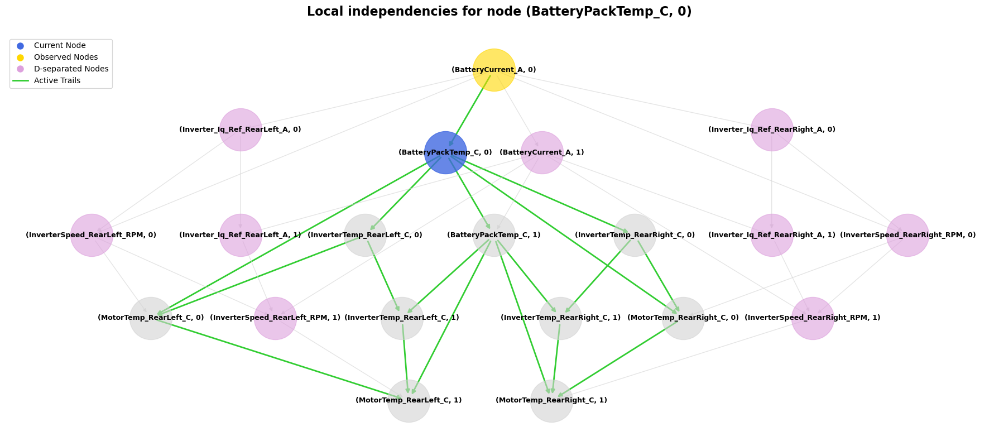


🔍 Visualizing local independencies for node: (BatteryPackTemp_C, 1)
(1, BatteryPackTemp_C ⟂ (MotorTemp_RearRight_C, 0), (InverterTemp_RearRight_C, 0), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (BatteryCurrent_A, 0), (InverterTemp_RearLeft_C, 0), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (InverterSpeed_RearRight_RPM, 0), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0) | (BatteryPackTemp_C, 0), (BatteryCurrent_A, 1))


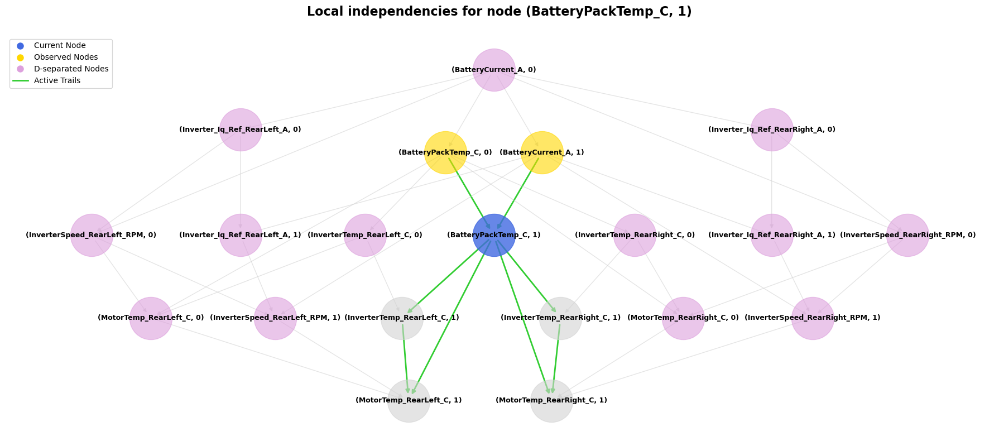


🔍 Visualizing local independencies for node: (InverterSpeed_RearLeft_RPM, 0)
(0, InverterSpeed_RearLeft_RPM ⟂ (InverterTemp_RearLeft_C, 1), (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (InverterTemp_RearLeft_C, 0), (Inverter_Iq_Ref_RearRight_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 0), (MotorTemp_RearRight_C, 1) | (Inverter_Iq_Ref_RearLeft_A, 0), (BatteryCurrent_A, 0))


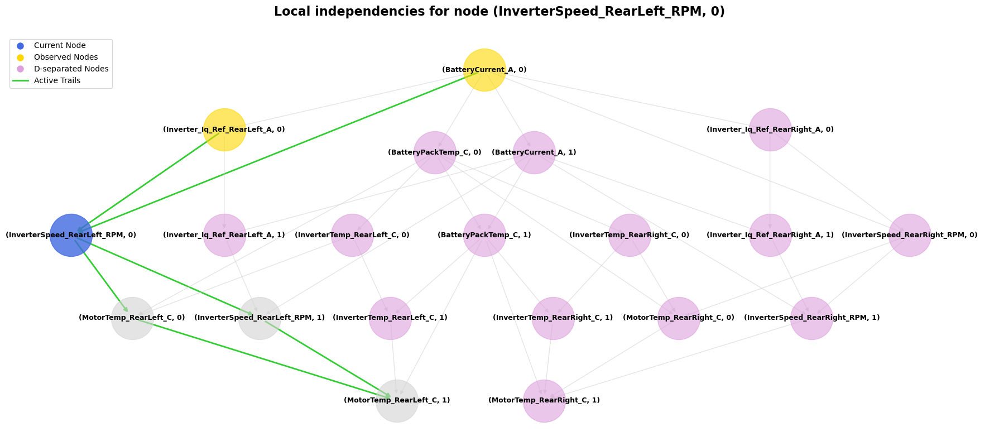


🔍 Visualizing local independencies for node: (InverterSpeed_RearLeft_RPM, 1)
(1, InverterSpeed_RearLeft_RPM ⟂ (InverterTemp_RearLeft_C, 1), (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearRight_A, 1), (BatteryCurrent_A, 0), (InverterTemp_RearLeft_C, 0), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 0), (MotorTemp_RearLeft_C, 0), (MotorTemp_RearRight_C, 1) | (Inverter_Iq_Ref_RearLeft_A, 1), (BatteryCurrent_A, 1), (InverterSpeed_RearLeft_RPM, 0))


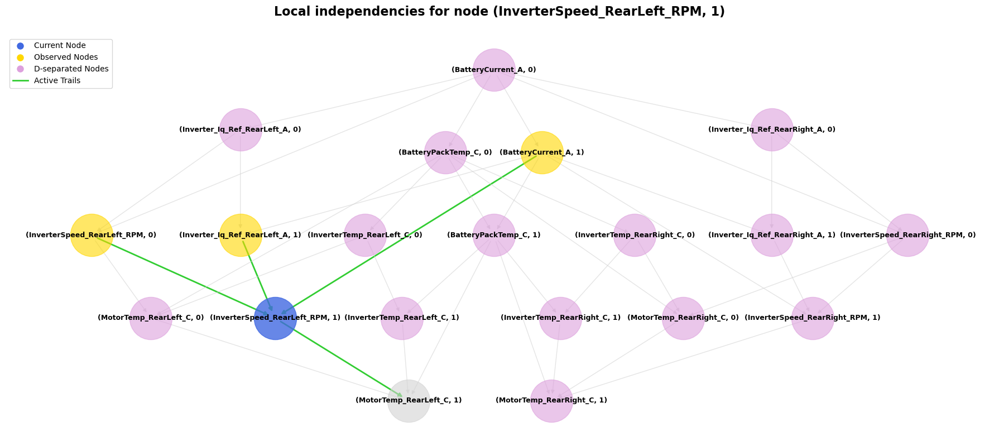


🔍 Visualizing local independencies for node: (InverterSpeed_RearRight_RPM, 0)
(0, InverterSpeed_RearRight_RPM ⟂ (InverterTemp_RearLeft_C, 1), (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (InverterTemp_RearLeft_C, 0), (MotorTemp_RearLeft_C, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0) | (Inverter_Iq_Ref_RearRight_A, 0), (BatteryCurrent_A, 0))


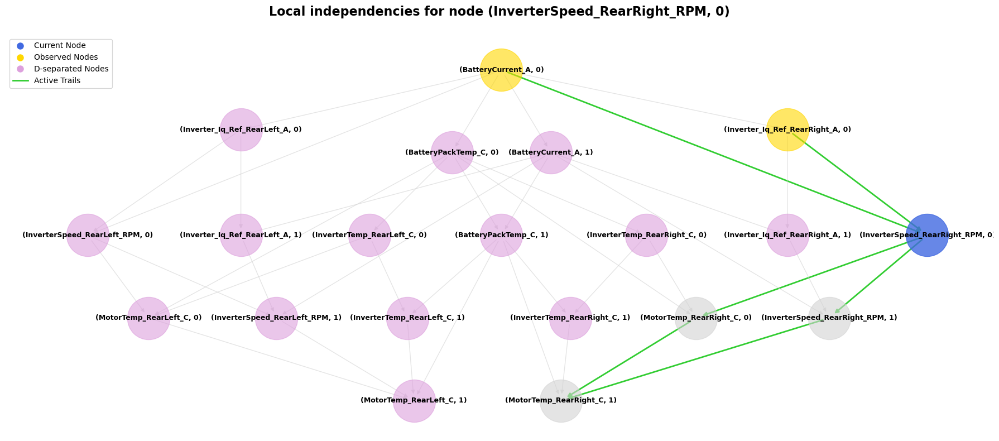


🔍 Visualizing local independencies for node: (InverterSpeed_RearRight_RPM, 1)
(1, InverterSpeed_RearRight_RPM ⟂ (InverterTemp_RearLeft_C, 1), (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (Inverter_Iq_Ref_RearLeft_A, 1), (BatteryCurrent_A, 0), (InverterTemp_RearLeft_C, 0), (MotorTemp_RearLeft_C, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0) | (Inverter_Iq_Ref_RearRight_A, 1), (InverterSpeed_RearRight_RPM, 0), (BatteryCurrent_A, 1))


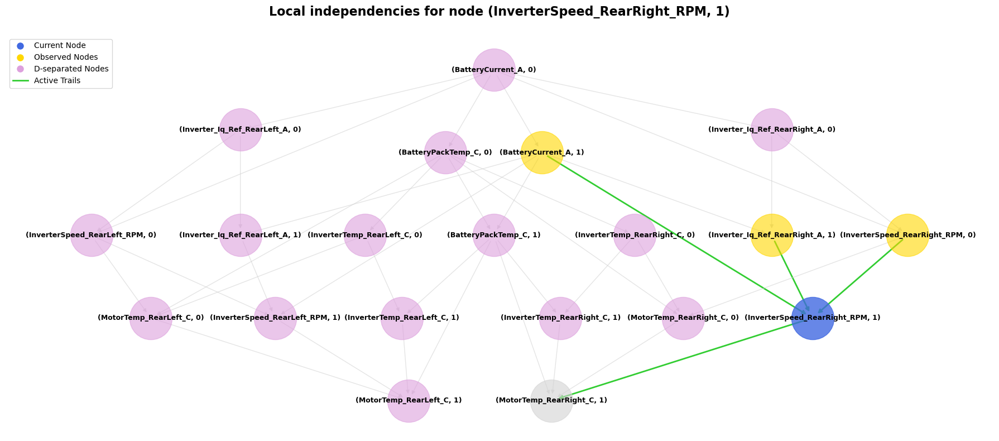


🔍 Visualizing local independencies for node: (InverterTemp_RearLeft_C, 0)
(0, InverterTemp_RearLeft_C ⟂ (MotorTemp_RearRight_C, 0), (InverterTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (BatteryCurrent_A, 0), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 0), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearRight_C, 1), (InverterSpeed_RearLeft_RPM, 0) | (BatteryPackTemp_C, 0))


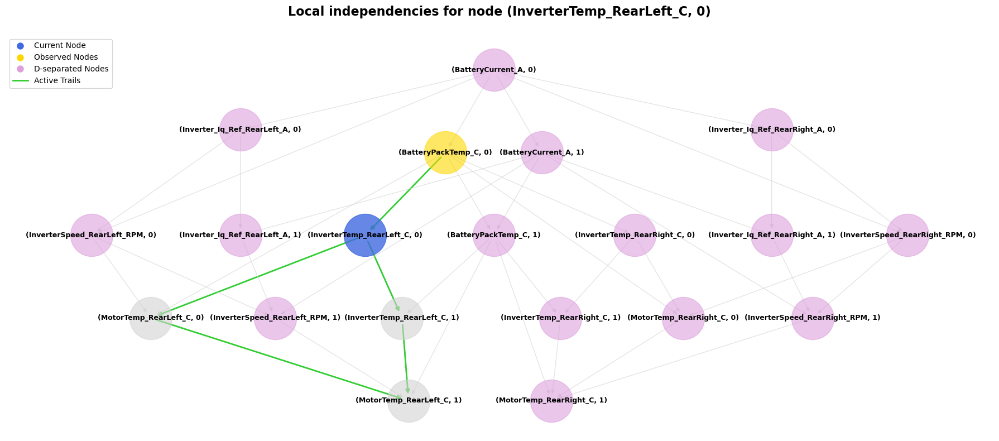


🔍 Visualizing local independencies for node: (InverterTemp_RearLeft_C, 1)
(1, InverterTemp_RearLeft_C ⟂ (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (BatteryCurrent_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0), (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 0), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearRight_C, 1) | (BatteryPackTemp_C, 1), (InverterTemp_RearLeft_C, 0))


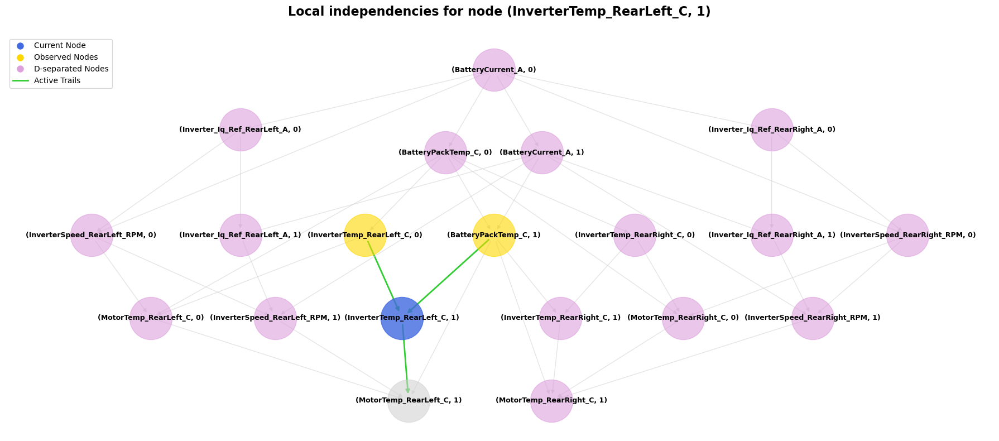


🔍 Visualizing local independencies for node: (InverterTemp_RearRight_C, 0)
(0, InverterTemp_RearRight_C ⟂ (InverterTemp_RearLeft_C, 1), (BatteryCurrent_A, 1), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (BatteryCurrent_A, 0), (InverterTemp_RearLeft_C, 0), (MotorTemp_RearLeft_C, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (BatteryPackTemp_C, 1), (InverterSpeed_RearRight_RPM, 0), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0) | (BatteryPackTemp_C, 0))


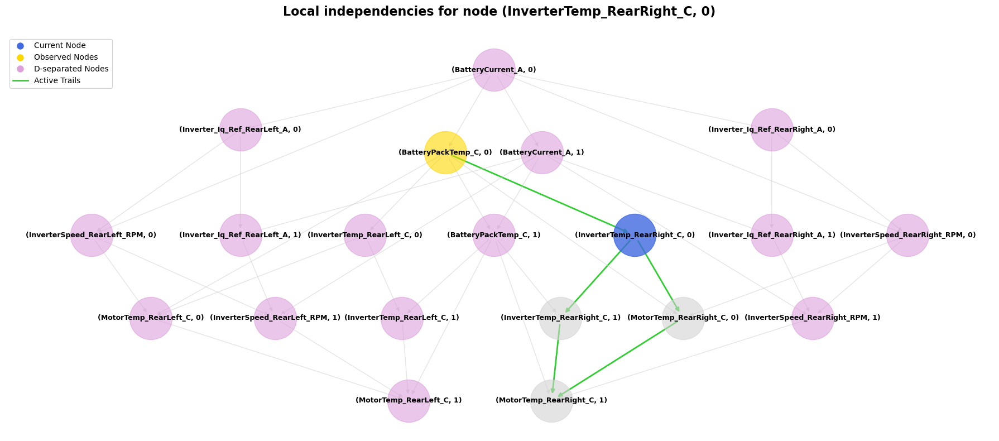


🔍 Visualizing local independencies for node: (InverterTemp_RearRight_C, 1)
(InverterTemp_RearRight_C, 1 ⟂ (InverterTemp_RearLeft_C, 1), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (BatteryCurrent_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0), (BatteryPackTemp_C, 0), (MotorTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (InverterTemp_RearLeft_C, 0), (MotorTemp_RearLeft_C, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (InverterSpeed_RearRight_RPM, 0), (InverterSpeed_RearLeft_RPM, 1) | (InverterTemp_RearRight_C, 0), (BatteryPackTemp_C, 1))


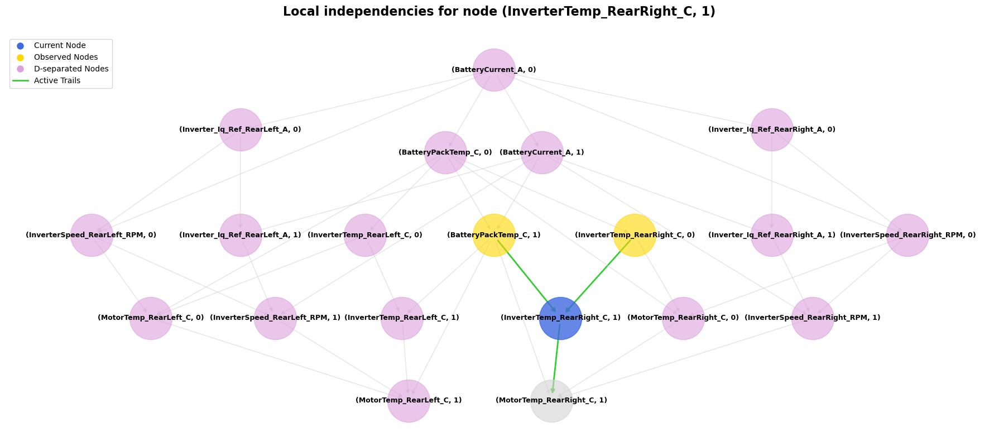


🔍 Visualizing local independencies for node: (Inverter_Iq_Ref_RearLeft_A, 0)
(Inverter_Iq_Ref_RearLeft_A, 0 ⟂ (BatteryPackTemp_C, 0), (InverterTemp_RearLeft_C, 1), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearRight_A, 1), (InverterTemp_RearLeft_C, 0), (Inverter_Iq_Ref_RearRight_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 0), (MotorTemp_RearRight_C, 1) | (BatteryCurrent_A, 0))


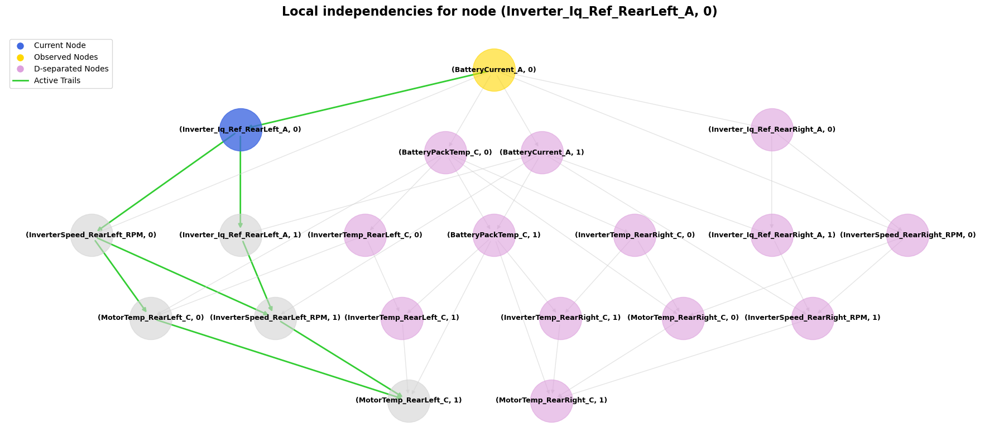


🔍 Visualizing local independencies for node: (Inverter_Iq_Ref_RearLeft_A, 1)
(Inverter_Iq_Ref_RearLeft_A, 1 ⟂ (InverterTemp_RearLeft_C, 1), (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearRight_A, 1), (BatteryCurrent_A, 0), (InverterTemp_RearLeft_C, 0), (Inverter_Iq_Ref_RearRight_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 0), (MotorTemp_RearLeft_C, 0), (MotorTemp_RearRight_C, 1), (InverterSpeed_RearLeft_RPM, 0) | (Inverter_Iq_Ref_RearLeft_A, 0), (BatteryCurrent_A, 1))


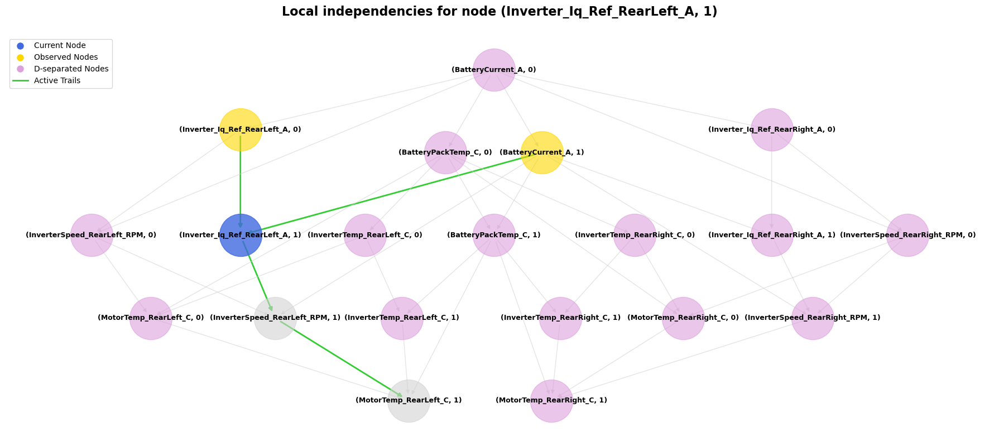


🔍 Visualizing local independencies for node: (Inverter_Iq_Ref_RearRight_A, 0)
(0, Inverter_Iq_Ref_RearRight_A ⟂ (InverterTemp_RearLeft_C, 1), (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (InverterTemp_RearLeft_C, 0), (MotorTemp_RearLeft_C, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0) | (BatteryCurrent_A, 0))


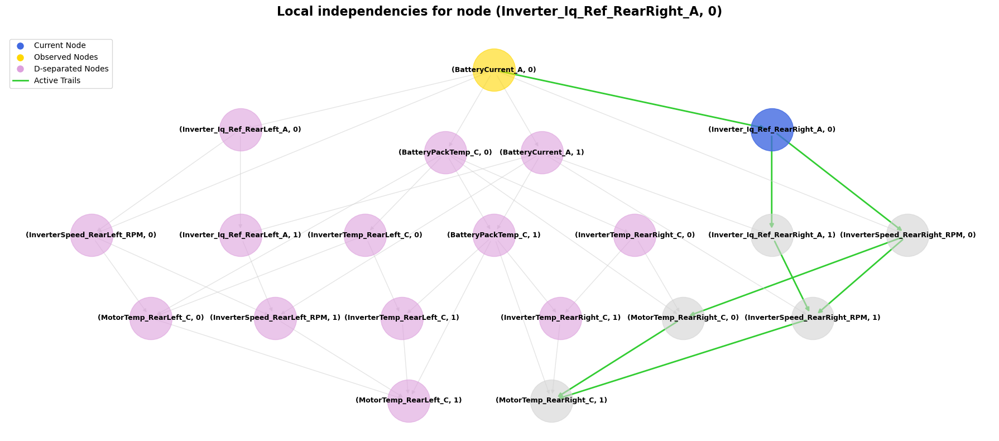


🔍 Visualizing local independencies for node: (Inverter_Iq_Ref_RearRight_A, 1)
(1, Inverter_Iq_Ref_RearRight_A ⟂ (InverterTemp_RearLeft_C, 1), (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (Inverter_Iq_Ref_RearLeft_A, 1), (BatteryCurrent_A, 0), (InverterTemp_RearLeft_C, 0), (MotorTemp_RearLeft_C, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 0), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0) | (Inverter_Iq_Ref_RearRight_A, 0), (BatteryCurrent_A, 1))


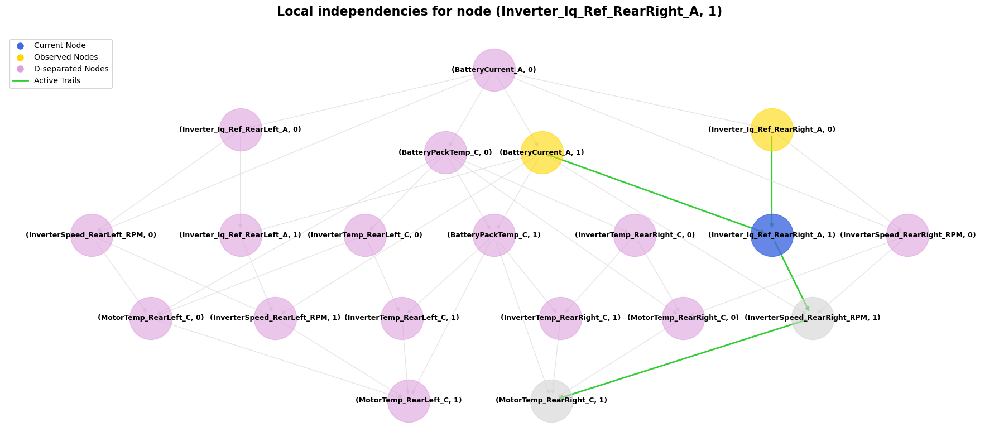


🔍 Visualizing local independencies for node: (MotorTemp_RearLeft_C, 0)
(0, MotorTemp_RearLeft_C ⟂ (InverterTemp_RearLeft_C, 1), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (BatteryCurrent_A, 0), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 0), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearRight_C, 1) | (BatteryPackTemp_C, 0), (InverterTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0))


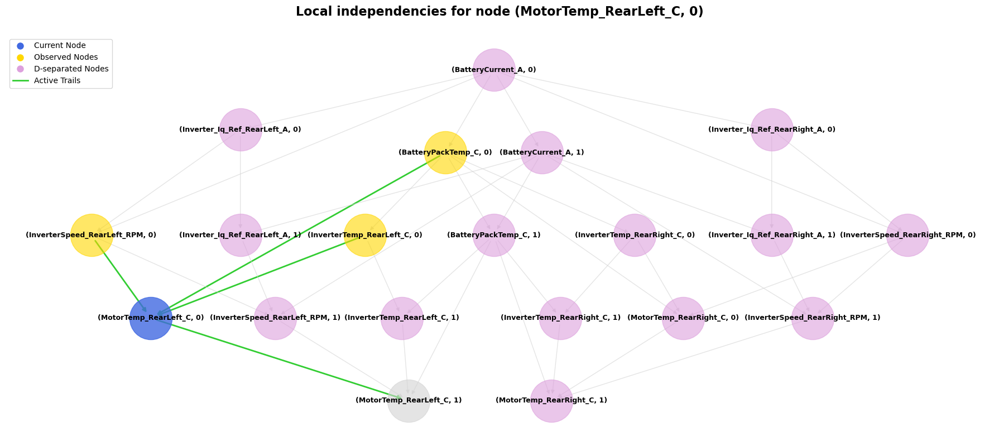


🔍 Visualizing local independencies for node: (MotorTemp_RearLeft_C, 1)
(1, MotorTemp_RearLeft_C ⟂ (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (MotorTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (BatteryCurrent_A, 0), (InverterTemp_RearLeft_C, 0), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 0), (MotorTemp_RearRight_C, 1), (InverterSpeed_RearLeft_RPM, 0) | (MotorTemp_RearLeft_C, 0), (InverterTemp_RearLeft_C, 1), (InverterSpeed_RearLeft_RPM, 1), (BatteryPackTemp_C, 1))


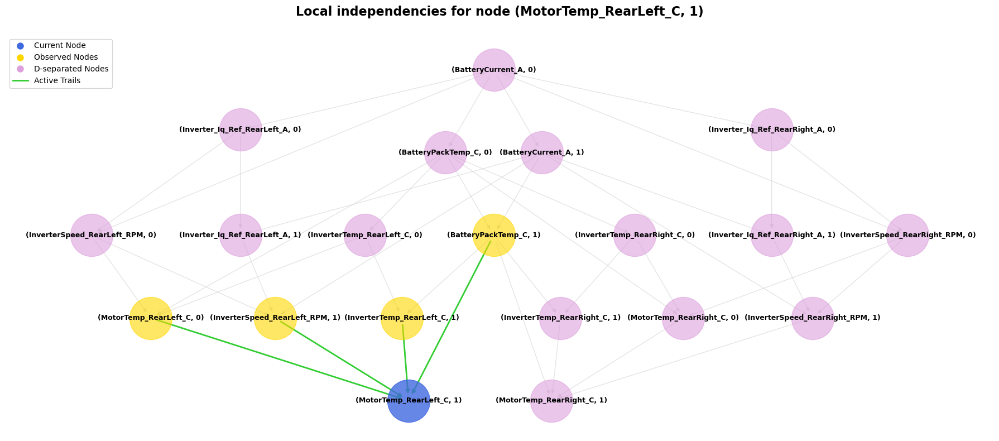


🔍 Visualizing local independencies for node: (MotorTemp_RearRight_C, 0)
(0, MotorTemp_RearRight_C ⟂ (InverterTemp_RearLeft_C, 1), (BatteryCurrent_A, 1), (InverterSpeed_RearRight_RPM, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (BatteryCurrent_A, 0), (InverterTemp_RearLeft_C, 0), (MotorTemp_RearLeft_C, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearLeft_RPM, 1), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0) | (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (InverterSpeed_RearRight_RPM, 0))


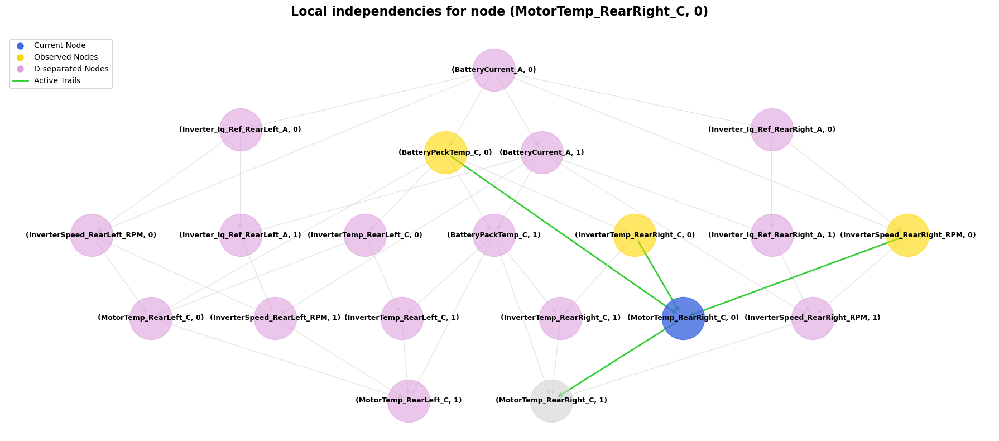


🔍 Visualizing local independencies for node: (MotorTemp_RearRight_C, 1)
(1, MotorTemp_RearRight_C ⟂ (InverterTemp_RearLeft_C, 1), (BatteryPackTemp_C, 0), (InverterTemp_RearRight_C, 0), (BatteryCurrent_A, 1), (Inverter_Iq_Ref_RearLeft_A, 1), (Inverter_Iq_Ref_RearRight_A, 1), (BatteryCurrent_A, 0), (InverterTemp_RearLeft_C, 0), (MotorTemp_RearLeft_C, 1), (Inverter_Iq_Ref_RearLeft_A, 0), (Inverter_Iq_Ref_RearRight_A, 0), (InverterSpeed_RearLeft_RPM, 1), (InverterSpeed_RearRight_RPM, 0), (MotorTemp_RearLeft_C, 0), (InverterSpeed_RearLeft_RPM, 0) | (MotorTemp_RearRight_C, 0), (BatteryPackTemp_C, 1), (InverterTemp_RearRight_C, 1), (InverterSpeed_RearRight_RPM, 1))


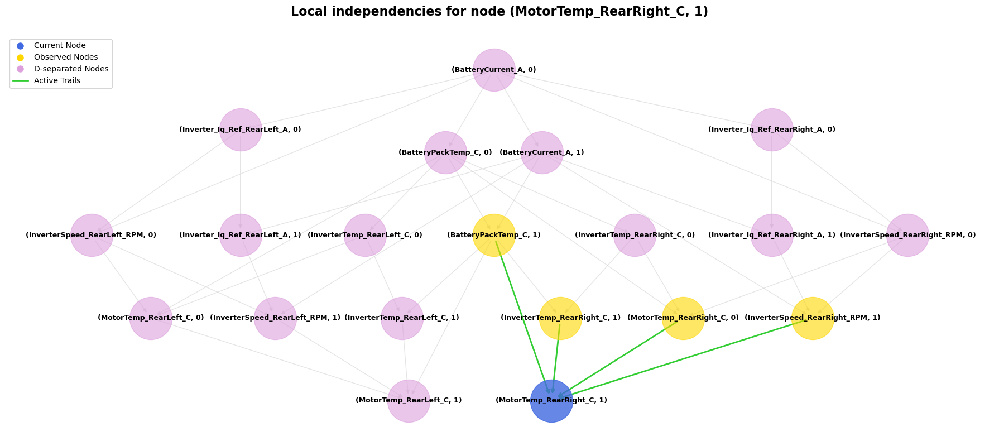

In [10]:
for node in dbn_model.model.nodes():
    print(f"\n🔍 Visualizing local independencies for node: {node}")
    
    try:
        # Get local independencies
        independencies = dbn_model.model.local_independencies(node)
        independence_str = str(independencies).strip()
        
        if independence_str:
            print(independence_str)
        else:
            print("⚠️ No independencies found.")
        
        # Visualize the Markov blanket
        dbn_model.visualize_local_independence(node)
        
    except Exception as e:
        print(f"❌ Could not visualize local independencies for node {node}.")
        print(f"Exception: {e}\n")

### 🔷 Markov blankets


🔍 Visualizing Markov blanket for node: (BatteryCurrent_A, 0)


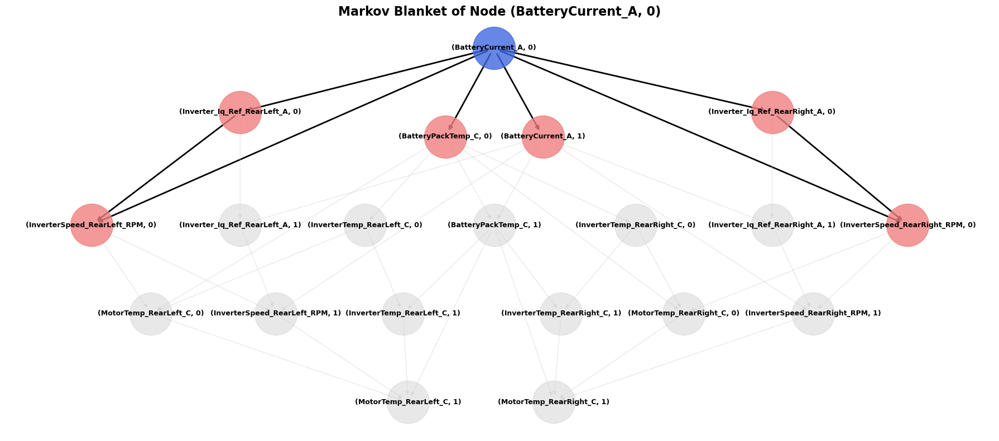


🔍 Visualizing Markov blanket for node: (BatteryCurrent_A, 1)


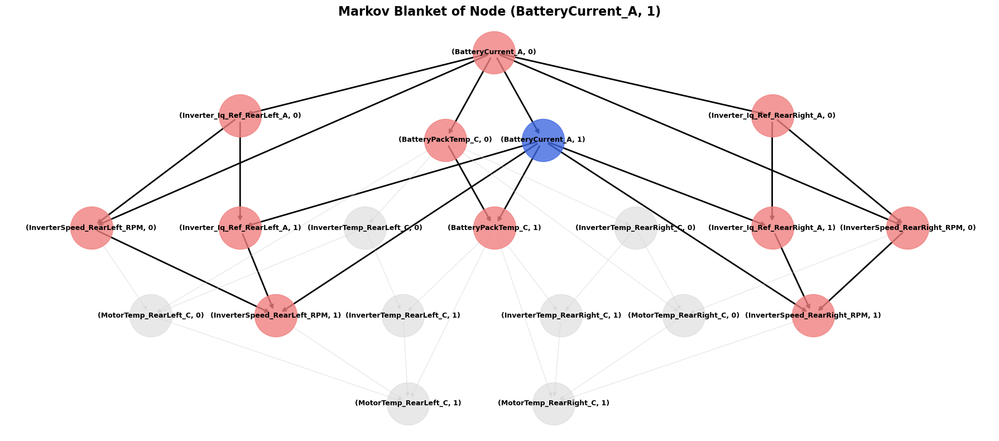


🔍 Visualizing Markov blanket for node: (BatteryPackTemp_C, 0)


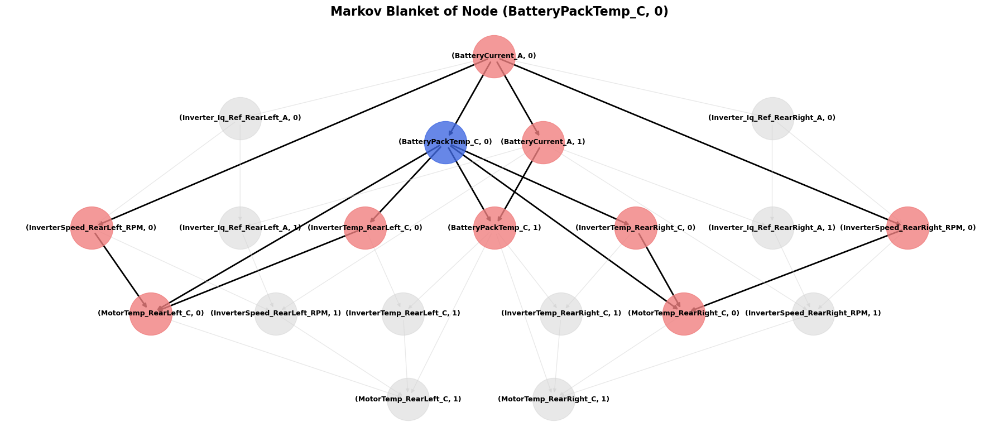


🔍 Visualizing Markov blanket for node: (BatteryPackTemp_C, 1)


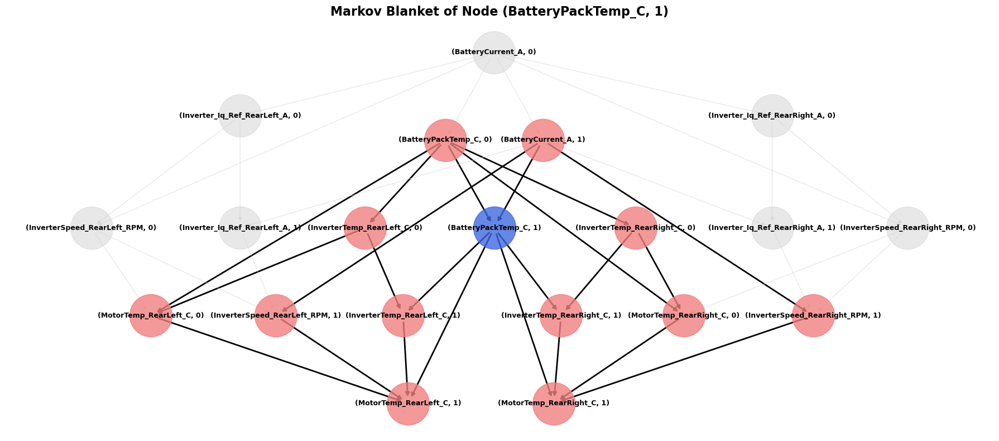


🔍 Visualizing Markov blanket for node: (InverterSpeed_RearLeft_RPM, 0)


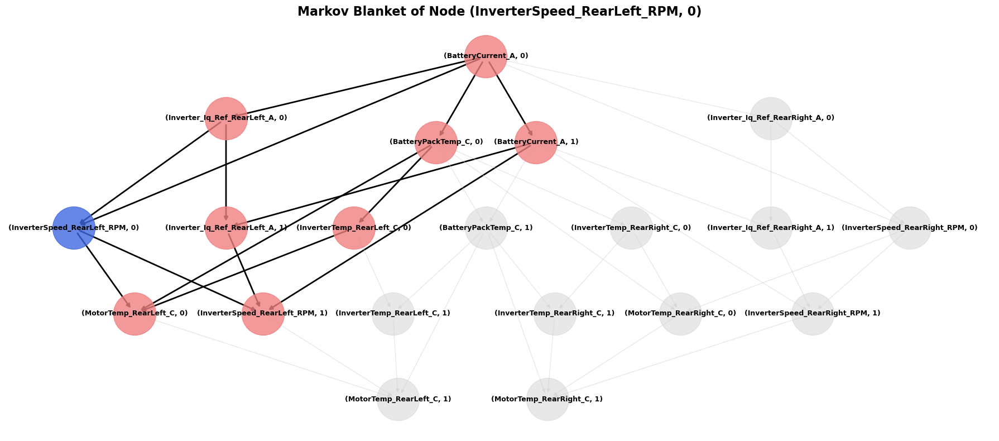


🔍 Visualizing Markov blanket for node: (InverterSpeed_RearLeft_RPM, 1)


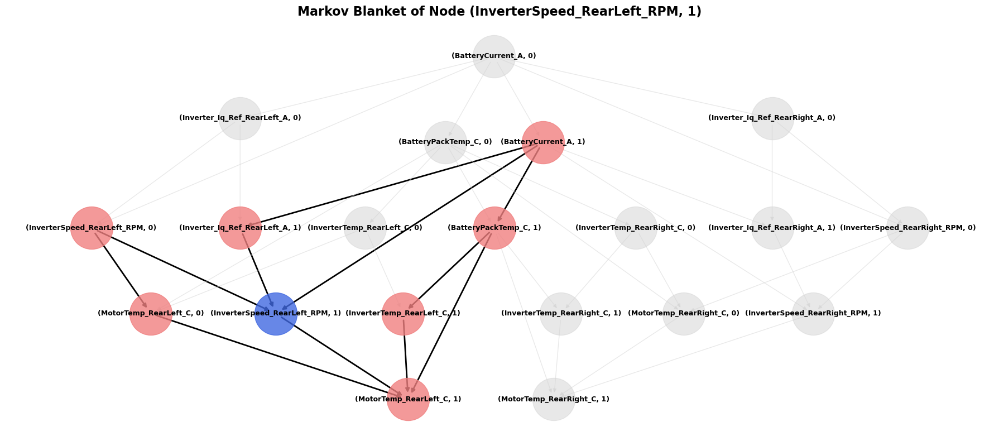


🔍 Visualizing Markov blanket for node: (InverterSpeed_RearRight_RPM, 0)


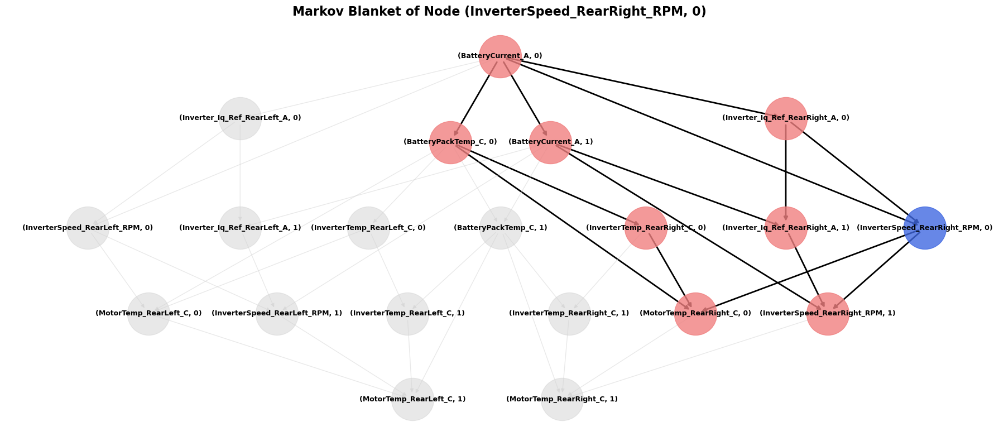


🔍 Visualizing Markov blanket for node: (InverterSpeed_RearRight_RPM, 1)


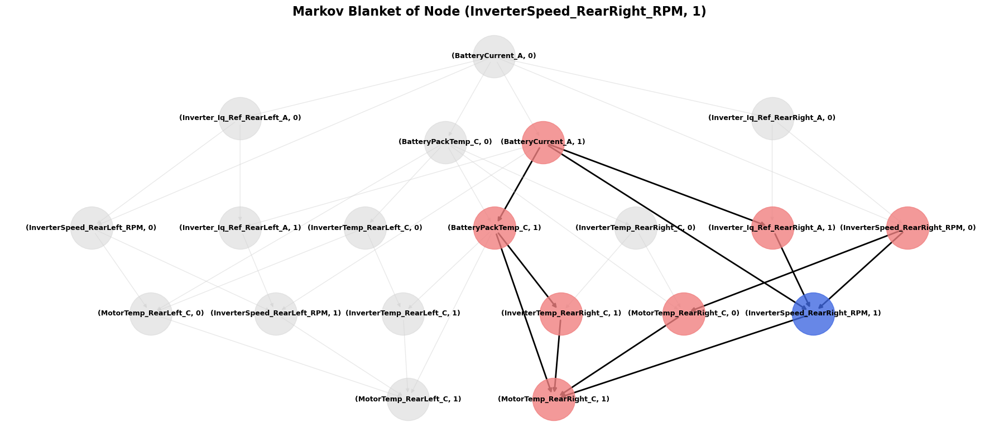


🔍 Visualizing Markov blanket for node: (InverterTemp_RearLeft_C, 0)


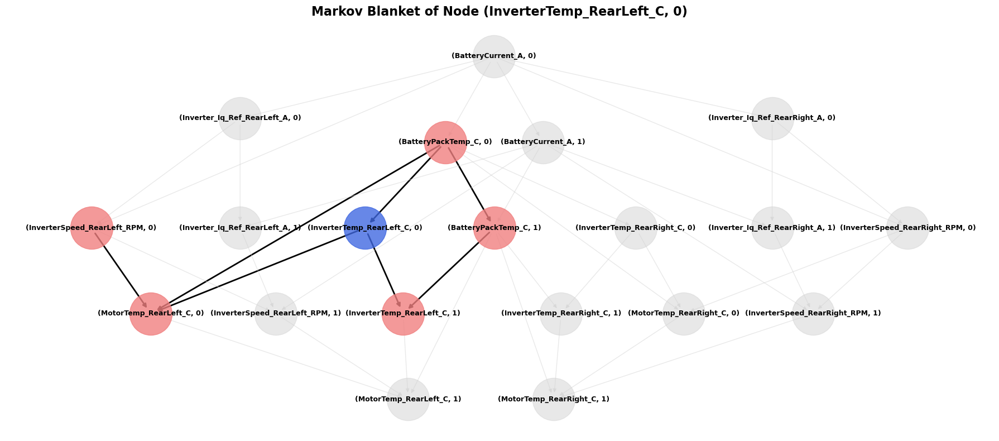


🔍 Visualizing Markov blanket for node: (InverterTemp_RearLeft_C, 1)


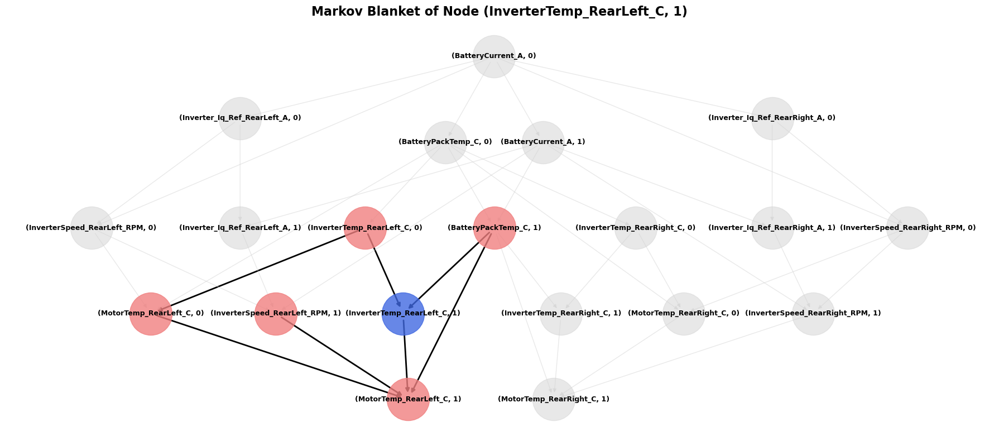


🔍 Visualizing Markov blanket for node: (InverterTemp_RearRight_C, 0)


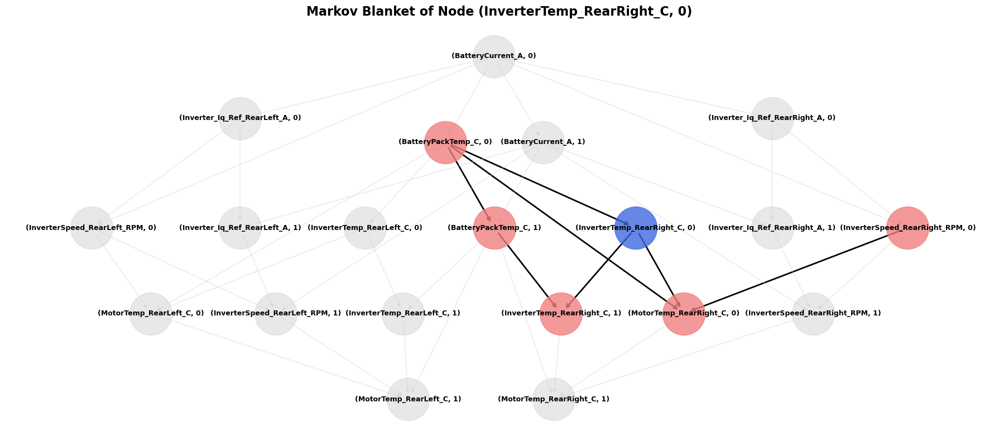


🔍 Visualizing Markov blanket for node: (InverterTemp_RearRight_C, 1)


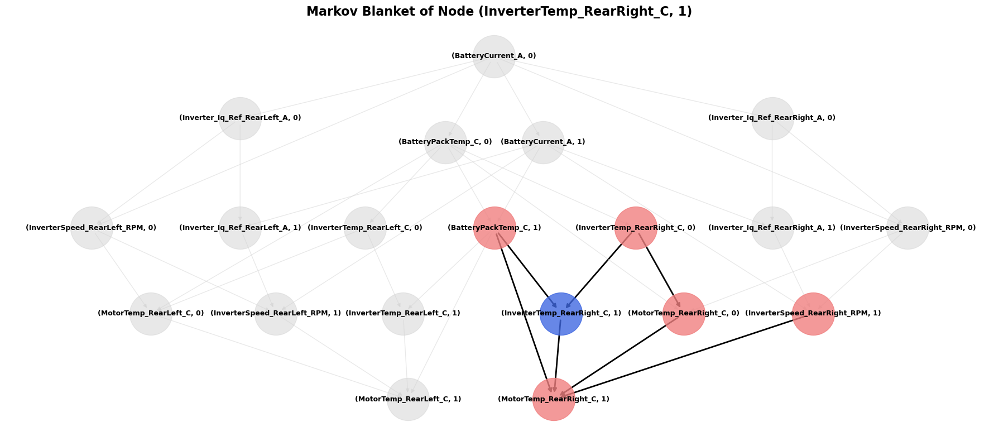


🔍 Visualizing Markov blanket for node: (Inverter_Iq_Ref_RearLeft_A, 0)


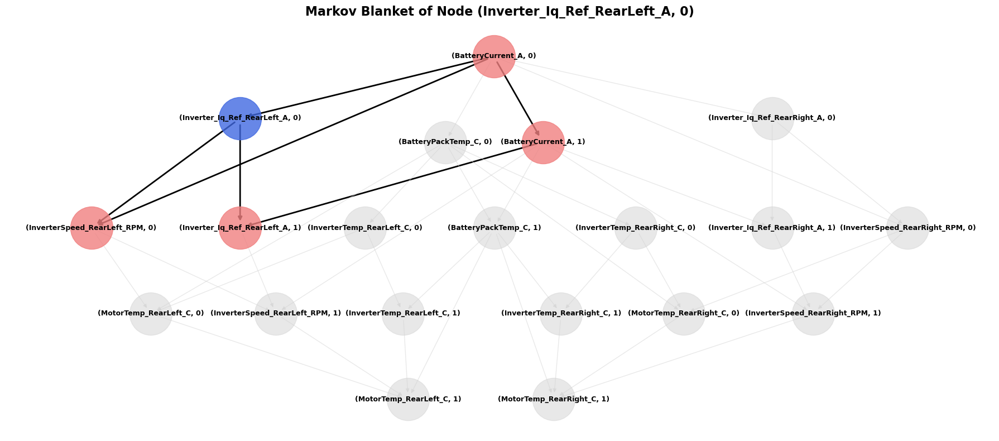


🔍 Visualizing Markov blanket for node: (Inverter_Iq_Ref_RearLeft_A, 1)


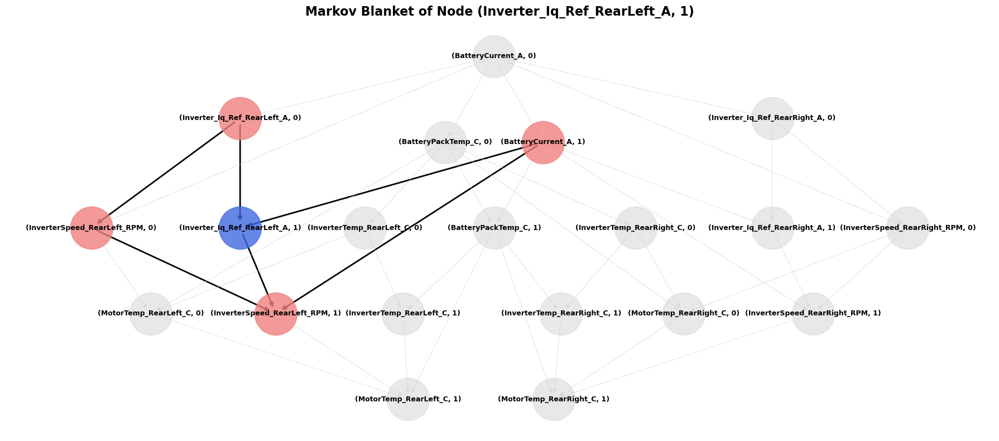


🔍 Visualizing Markov blanket for node: (Inverter_Iq_Ref_RearRight_A, 0)


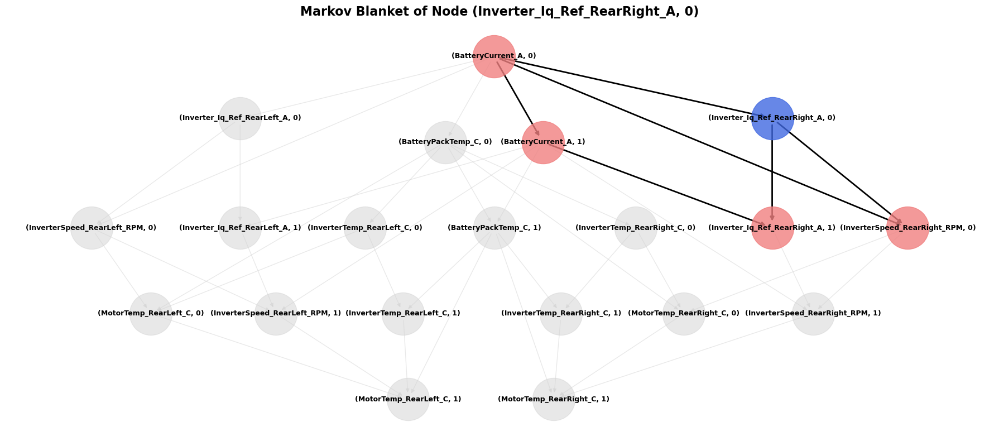


🔍 Visualizing Markov blanket for node: (Inverter_Iq_Ref_RearRight_A, 1)


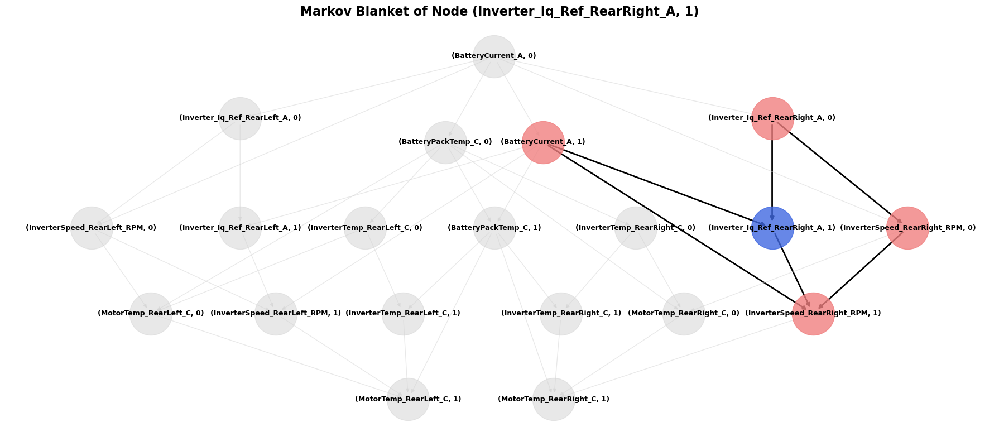


🔍 Visualizing Markov blanket for node: (MotorTemp_RearLeft_C, 0)


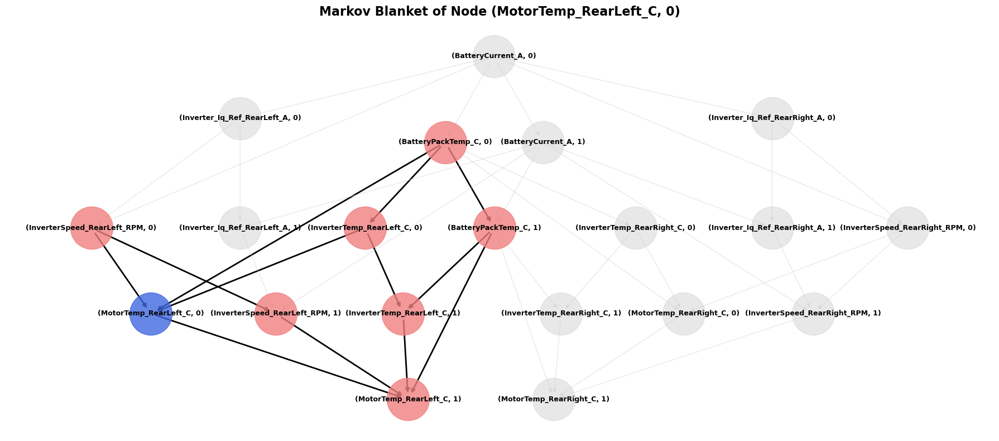


🔍 Visualizing Markov blanket for node: (MotorTemp_RearLeft_C, 1)


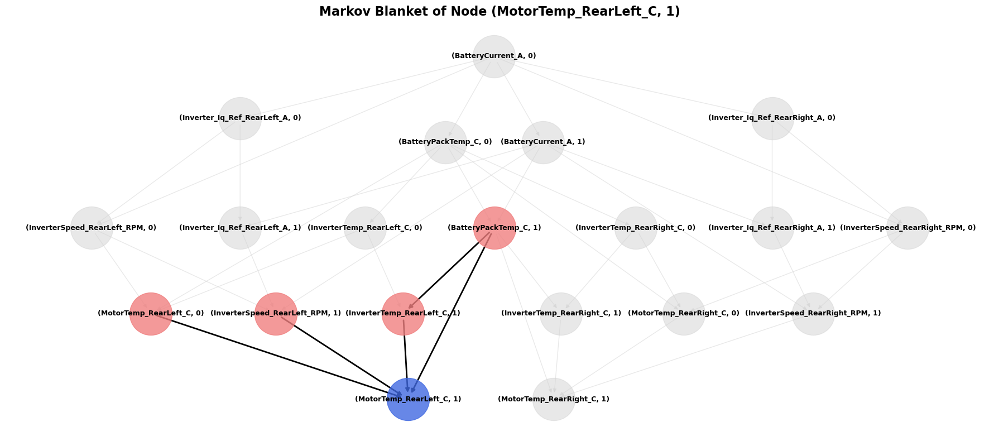


🔍 Visualizing Markov blanket for node: (MotorTemp_RearRight_C, 0)


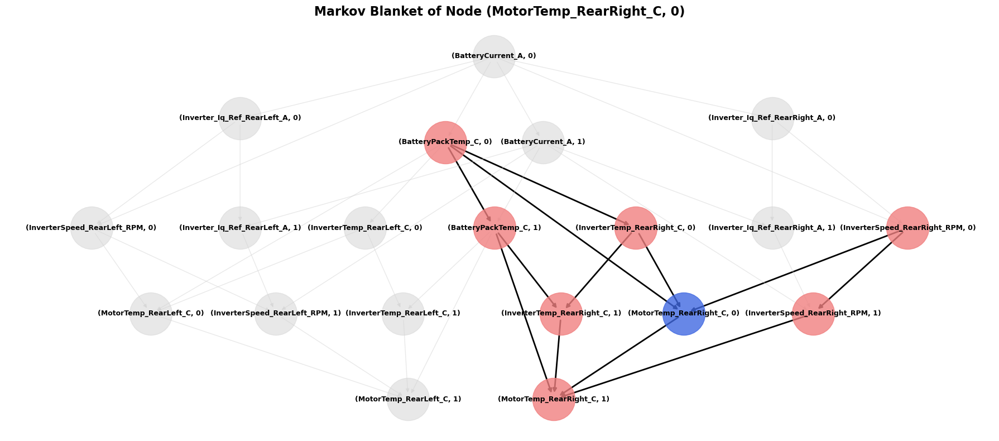


🔍 Visualizing Markov blanket for node: (MotorTemp_RearRight_C, 1)


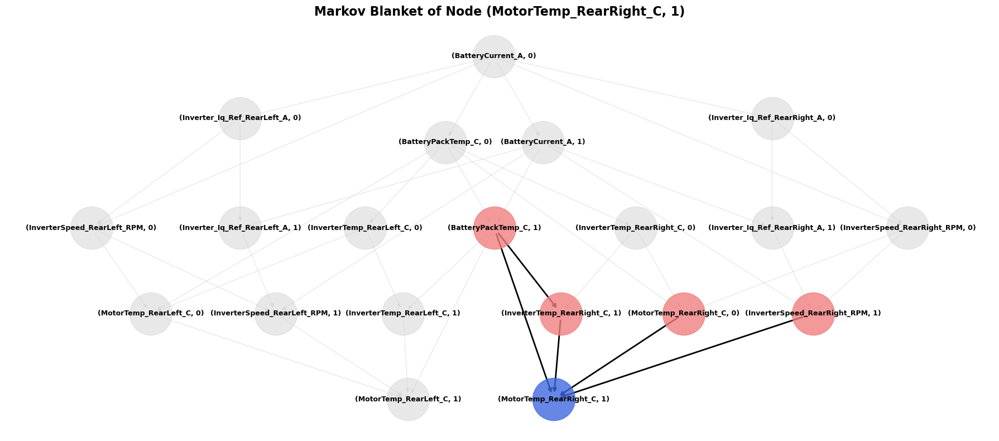

In [11]:
for node in dbn_model.model.nodes():
    try:
        # Visualize Markov blanket for each node
        print(f"\n🔍 Visualizing Markov blanket for node: {node}")
        dbn_model.visualize_markov_blanket(node)
    
    except Exception as e:
        print(f"❌ Error visualizing Markov blanket for node {node}.")
        print(f"Exception: {e}\n")

## ⚖️ Evaluation of the Dynamic Bayesian Netowrk performances

### 🔷 Load anomalous dataset

In [12]:
# Load anomalous data
anomalous_dbn_data = pd.read_csv(r'.\data\dbn-datasets-imola\anomalous-dbn-imola.csv', header=[0,1]).astype(np.int8)

# Reformat column names for pgmpy DBN (variable, time slice)
anomalous_dbn_data.columns = pd.MultiIndex.from_tuples(
    [(var, int(ts)) for var, ts in anomalous_dbn_data.columns]
)

# Display basic information about the dataset
display(anomalous_dbn_data.info(verbose=True))
display(anomalous_dbn_data.head())
display(anomalous_dbn_data.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 267404 entries, 0 to 267403
Data columns (total 26 columns):
 #   Column                            Non-Null Count   Dtype
---  ------                            --------------   -----
 0   (BatteryVoltage_V, 0)             267404 non-null  int8 
 1   (BatteryCurrent_A, 0)             267404 non-null  int8 
 2   (BatteryPackTemp_C, 0)            267404 non-null  int8 
 3   (InverterSpeed_RearLeft_RPM, 0)   267404 non-null  int8 
 4   (Inverter_Iq_Ref_RearLeft_A, 0)   267404 non-null  int8 
 5   (Inverter_Id_Ref_RearLeft_A, 0)   267404 non-null  int8 
 6   (MotorTemp_RearLeft_C, 0)         267404 non-null  int8 
 7   (InverterTemp_RearLeft_C, 0)      267404 non-null  int8 
 8   (InverterSpeed_RearRight_RPM, 0)  267404 non-null  int8 
 9   (Inverter_Iq_Ref_RearRight_A, 0)  267404 non-null  int8 
 10  (Inverter_Id_Ref_RearRight_A, 0)  267404 non-null  int8 
 11  (MotorTemp_RearRight_C, 0)        267404 non-null  int8 
 12  (InverterTemp_Re

None

,BatteryVoltage_V,BatteryCurrent_A,BatteryPackTemp_C,InverterSpeed_RearLeft_RPM,Inverter_Iq_Ref_RearLeft_A,Inverter_Id_Ref_RearLeft_A,MotorTemp_RearLeft_C,InverterTemp_RearLeft_C,InverterSpeed_RearRight_RPM,Inverter_Iq_Ref_RearRight_A,...,InverterSpeed_RearLeft_RPM,Inverter_Iq_Ref_RearLeft_A,Inverter_Id_Ref_RearLeft_A,MotorTemp_RearLeft_C,InverterTemp_RearLeft_C,InverterSpeed_RearRight_RPM,Inverter_Iq_Ref_RearRight_A,Inverter_Id_Ref_RearRight_A,MotorTemp_RearRight_C,InverterTemp_RearRight_C
,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
0,1,0,0,2,0,0,1,1,2,1,...,2,0,0,1,1,2,1,2,1,1
1,1,0,0,2,0,0,1,1,2,1,...,2,0,0,1,1,2,1,2,1,1
2,1,0,0,2,0,0,1,1,2,1,...,2,0,0,1,1,2,1,2,1,1
3,1,0,0,2,0,0,1,1,2,1,...,2,0,0,1,1,2,1,2,1,1
4,1,0,0,2,0,0,1,1,2,1,...,2,0,0,1,1,2,1,2,1,1


,BatteryVoltage_V,BatteryCurrent_A,BatteryPackTemp_C,InverterSpeed_RearLeft_RPM,Inverter_Iq_Ref_RearLeft_A,Inverter_Id_Ref_RearLeft_A,MotorTemp_RearLeft_C,InverterTemp_RearLeft_C,InverterSpeed_RearRight_RPM,Inverter_Iq_Ref_RearRight_A,...,InverterSpeed_RearLeft_RPM,Inverter_Iq_Ref_RearLeft_A,Inverter_Id_Ref_RearLeft_A,MotorTemp_RearLeft_C,InverterTemp_RearLeft_C,InverterSpeed_RearRight_RPM,Inverter_Iq_Ref_RearRight_A,Inverter_Id_Ref_RearRight_A,MotorTemp_RearRight_C,InverterTemp_RearRight_C
,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
count,267404.000000,267404.000000,267404.000000,267404.000000,267404.0,267404.0,267404.000000,267404.000000,267404.000000,267404.000000,...,267404.000000,267404.0,267404.0,267404.000000,267404.000000,267404.000000,267404.000000,267404.000000,267404.000000,267404.00000
mean,1.330608,0.164807,0.978101,0.490943,0.0,0.0,0.845560,0.937892,0.274454,0.999035,...,0.490913,0.0,0.0,0.845567,0.937869,0.274424,0.999035,1.998399,0.934309,1.01730
std,0.543863,0.372476,0.722215,0.571002,0.0,0.0,0.427055,0.449116,0.530685,0.031047,...,0.570976,0.0,0.0,0.427067,0.449121,0.530644,0.031047,0.054399,0.443685,0.46154
min,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,1.000000,0.000000,0.000000,0.000000,0.0,0.0,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.0,0.0,1.000000,1.000000,0.000000,1.000000,2.000000,1.000000,1.00000
50%,1.000000,0.000000,1.000000,0.000000,0.0,0.0,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.0,0.0,1.000000,1.000000,0.000000,1.000000,2.000000,1.000000,1.00000
75%,2.000000,0.000000,2.000000,1.000000,0.0,0.0,1.000000,1.000000,0.000000,1.000000,...,1.000000,0.0,0.0,1.000000,1.000000,0.000000,1.000000,2.000000,1.000000,1.00000
max,2.000000,2.000000,2.000000,2.000000,0.0,0.0,2.000000,2.000000,2.000000,1.000000,...,2.000000,0.0,0.0,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,2.00000


### 🔷 Compute the log-likelihood scores

In [ ]:
# Sample 100,000 rows from normal test data for testing
test_normal_data = test_normal_dbn_data.sample(n=100_000, random_state=42)
# The remaining data will be used as validation
validate_normal_data = test_normal_dbn_data.drop(test_normal_data.index)

# Compute log-likelihood for normal data
ll_normal, ll_normal_scores = dbn_model.compute_log_likelihood(test_normal_data)

# Sample 100,000 rows from anomalous test data for testing
test_anomalous_data = anomalous_dbn_data.sample(n=100_000, random_state=42)
# The remaining anomalous data will be used as validation
validate_anomalous_data = anomalous_dbn_data.drop(test_anomalous_data.index)

# Compute log-likelihood for anomalous data
ll_anomalous, ll_anomalous_scores = dbn_model.compute_log_likelihood(test_anomalous_data)

# Output log-likelihood results
print(f"Log-likelihood for normal data: {ll_normal:.4f}")
print(f"Log-likelihood for anomalous data: {ll_anomalous:.4f}")

Computing log-likelihood:   0%|          | 0/100000 [00:00<?, ?it/s]

Computing log-likelihood:   0%|          | 0/100000 [00:00<?, ?it/s]

Log-likelihood for normal data: -40235.4719
Log-likelihood for anomalous data: -196581.9639


#### 🔹 Visualize the log-likelihood distributions

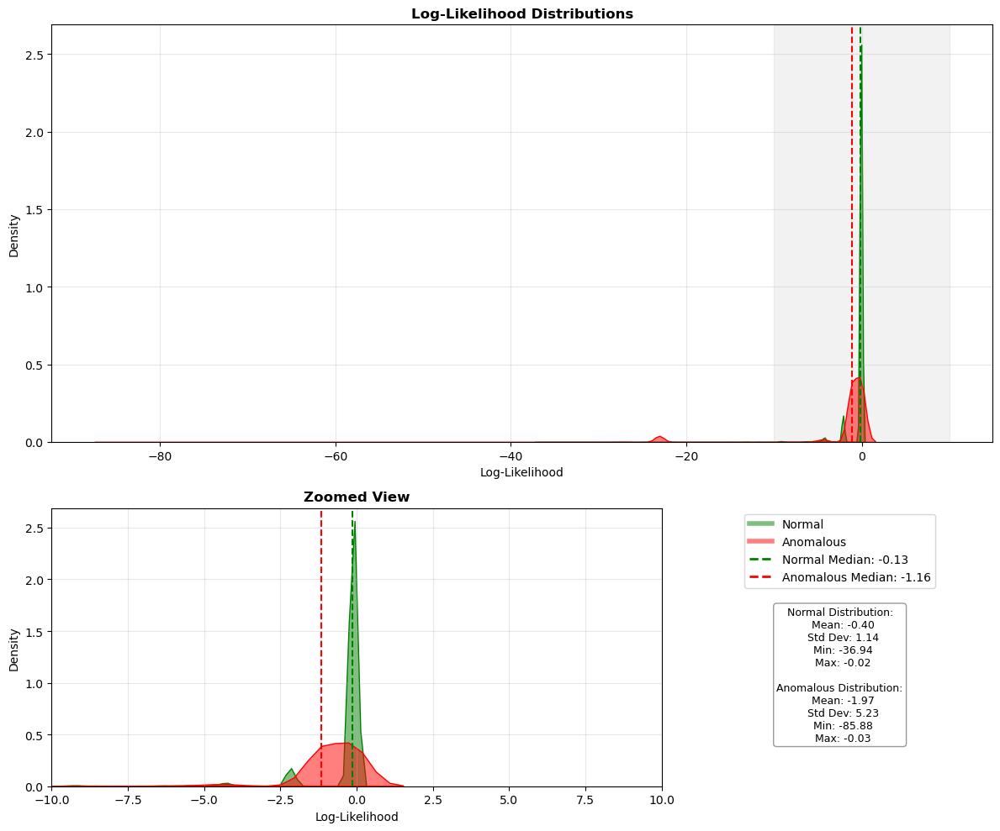

In [14]:
# Plot KDE for log-likelihood scores of normal vs anomalous data
DataVisualizer.plot_log_likelihood_kde_with_zoom(
    ll_normal_scores,    # Log-likelihood scores for normal data
    ll_anomalous_scores  # Log-likelihood scores for anomalous data
);

## 🧮 Test anomaly detection capability on new data

In [15]:
# Select threshold based on the 10-th percentile of normal log-likelihood scores
threshold = np.percentile(ll_normal_scores, 10)
print(f"Selected threshold: {threshold}")

# Make predictions on the validation data for both normal and anomalous samples
normal_predictions = dbn_model.predict(
    validate_normal_data.sample(n=20_000, random_state=42),
    threshold
)

anomalous_predictions = dbn_model.predict(
    validate_anomalous_data.sample(n=20_000, random_state=42),
    threshold
)

# Display predictions for normal data
print("Normal predictions:")
print(np.unique(normal_predictions, return_counts=True))

# Display predictions for anomalous data
print("Anomalous predictions:")
print(np.unique(anomalous_predictions, return_counts=True))

Selected threshold: -0.1843417220455575


Computing log-likelihood:   0%|          | 0/20000 [00:00<?, ?it/s]

Computing log-likelihood:   0%|          | 0/20000 [00:00<?, ?it/s]

Normal predictions:
(array([0, 1]), array([17987,  2013], dtype=int64))
Anomalous predictions:
(array([0, 1]), array([ 9480, 10520], dtype=int64))


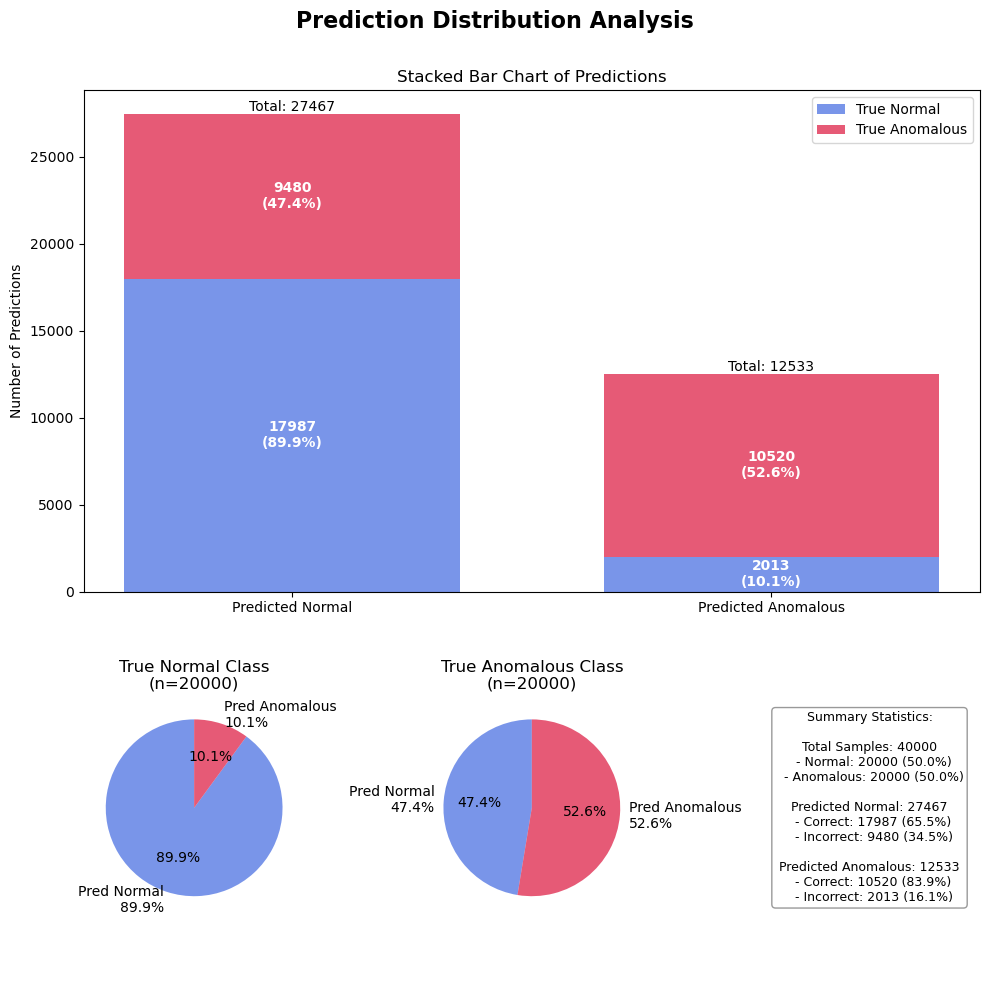

In [16]:
# Plot a bar chart to compare prediction distributions for normal and anomalous data
DataVisualizer.plot_prediction_bar_chart(
    normal_predictions,    # Predictions for the normal data
    anomalous_predictions  # Predictions for the anomalous data
);

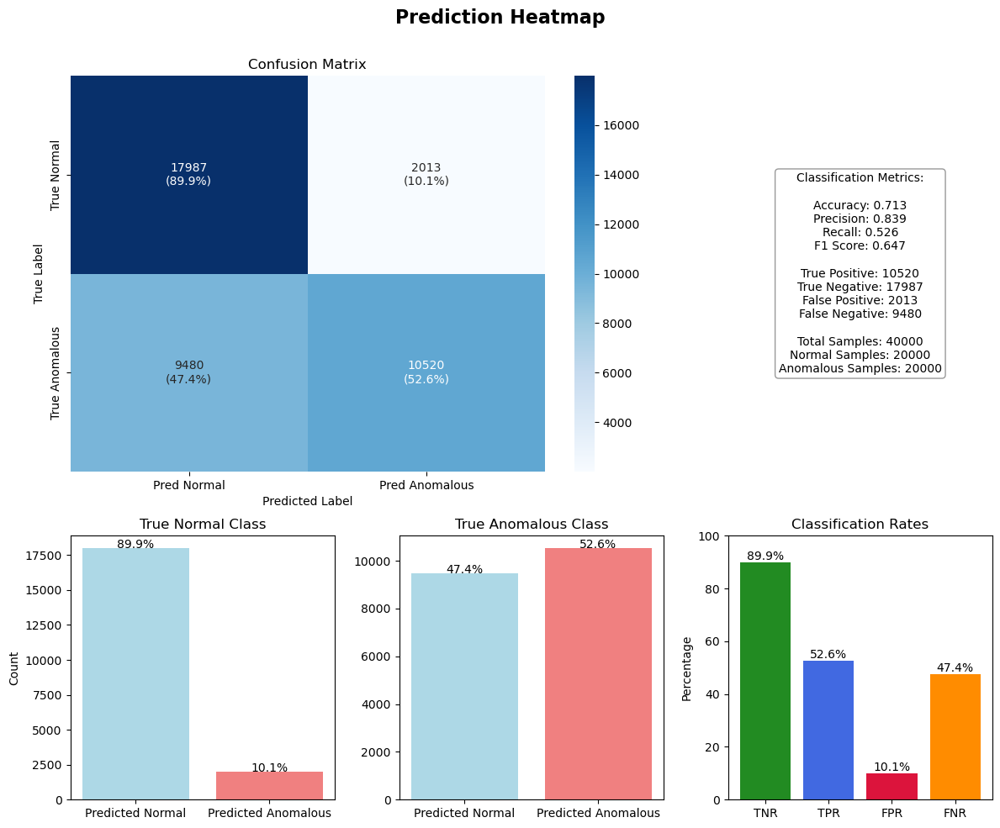

In [17]:
# Plot a heatmap to visualize prediction results for normal and anomalous data
DataVisualizer.plot_prediction_heatmap(
    normal_predictions,    # Predictions for the normal data
    anomalous_predictions  # Predictions for the anomalous data
);

## 🏁 Final considerations

The model achieved log-likelihood scores of $−40235.4719$
for normal data and $−196581.9639$ for anomalous data, demonstrating 
effective learning of normal patterns despite lacking perfect separation.
These limitations stem from dataset challenges rather than the 2-TBN model 
itself. Overall, while the DBN modelled normal behaviour
successfully, more sophisticated modelling and richer data
would be necessary for reliable inverter fault detection in
the Athena EV.